**The purpose of this analysis is strictly to focus on the 2008 Financial Crisis. We will deep dive into exploratory analysis to see what major banks failed first and which ones survived. We will also take a look at some intersting grpahing techniques related to finance.**

In [91]:
#importing in all necessary modules
try:
    from pandas_datareader import data, wb
    import pandas as pd
    import numpy as np
    import datetime
    import seaborn as sns
    import pandas_datareader.data as web
    %matplotlib inline
    print("Imported!")
except: 
    print("Not imported")

Imported!


In [93]:
#creating datetime variables for reference
start = datetime.datetime(2006, 1, 1)
end = datetime.datetime(2018, 1, 1)

In [94]:
#Referencing the 'Stooq.com' datareader API. Docs --> "https://pandas-datareader.readthedocs.io/en/latest/readers/stooq.html"

import pandas_datareader.data as web
BofA = web.DataReader('BAC', 'stooq', start, end)

Citi = web.DataReader('C', 'stooq', start, end)

Goldman = web.DataReader('GS', 'stooq', start, end)

JpMorgan = web.DataReader('JPM', 'stooq', start, end)

MorganS = web.DataReader('MS', 'stooq', start, end)

WellsF = web.DataReader('WFC', 'stooq', start, end)

In [95]:
tickers = ['BAC', 'C', 'GS', 'JPM', 'MS', 'WFC']

In [97]:
bank_stocks = pd.concat([BofA, Citi, Goldman, JpMorgan, MorganS, WellsF], axis=1, keys=tickers)

In [158]:
#sorting data from oldest to newest dates
bank_stocks = bank_stocks.sort_index(ascending=True)
bank_stocks.head()

Bank Ticker     BAC                                           C          \
Stock Info     Open    High     Low   Close      Volume    Open    High   
Date                                                                      
2006-01-03   41.185  41.410  40.508  41.324  18565928.0  434.68  438.02   
2006-01-04   41.255  41.468  40.772  40.886  20230721.0  433.45  435.56   
2006-01-05   40.886  41.106  40.659  40.939  16887242.0  429.69  432.71   
2006-01-06   41.078  41.175  40.686  40.877  14348537.0  433.61  433.77   
2006-01-09   41.009  41.229  40.693  40.904  17794318.0  431.11  432.35   

Bank Ticker                             ...      MS                          \
Stock Info      Low   Close     Volume  ...    Open    High     Low   Close   
Date                                    ...                                   
2006-01-03   426.76  437.25  1733359.0  ...  39.739  40.653  39.435  40.527   
2006-01-04   428.88  429.16  2109140.0  ...  40.804  41.205  40.559  40.559   
2006-01-05   429.34  431.27  1279794.0  ...  40.559  40.726  40.323  40.670   
2006-01-06   427.57  431.27  1544654.0  ...  40.851  40.902  40.350  40.710   
2006-01-09   428.44  429.25  1894722.0  ...  40.749  41.213  40.741  41.136   

Bank Ticker                WFC                                      
Stock Info      Volume    Open    High     Low   Close      Volume  
Date                                                                
2006-01-03   6421817.0  23.594  23.876  23.296  23.818  14754974.0  
2006-01-04   9527984.0  23.740  23.755  23.413  23.541  14558894.0  
2006-01-05   6900739.0  23.518  23.556  23.375  23.518  13569368.0  
2006-01-06   8228569.0  23.581  23.720  23.437  23.651  11255751.0  
2006-01-09   4949824.0  23.651  23.755  23.556  23.651   7526696.0  

[5 rows x 30 columns]

In [99]:
#Creating a multilayered dataframe
bank_stocks.columns.names = ['Bank Ticker','Stock Info']

In [100]:
bank_stocks.head()

Bank Ticker     BAC                                           C          \
Stock Info     Open    High     Low   Close      Volume    Open    High   
Date                                                                      
2006-01-03   41.185  41.410  40.508  41.324  18565928.0  434.68  438.02   
2006-01-04   41.255  41.468  40.772  40.886  20230721.0  433.45  435.56   
2006-01-05   40.886  41.106  40.659  40.939  16887242.0  429.69  432.71   
2006-01-06   41.078  41.175  40.686  40.877  14348537.0  433.61  433.77   
2006-01-09   41.009  41.229  40.693  40.904  17794318.0  431.11  432.35   

Bank Ticker                             ...      MS                          \
Stock Info      Low   Close     Volume  ...    Open    High     Low   Close   
Date                                    ...                                   
2006-01-03   426.76  437.25  1733359.0  ...  39.739  40.653  39.435  40.527   
2006-01-04   428.88  429.16  2109140.0  ...  40.804  41.205  40.559  40.559   
2006-01-05   429.34  431.27  1279794.0  ...  40.559  40.726  40.323  40.670   
2006-01-06   427.57  431.27  1544654.0  ...  40.851  40.902  40.350  40.710   
2006-01-09   428.44  429.25  1894722.0  ...  40.749  41.213  40.741  41.136   

Bank Ticker                WFC                                      
Stock Info      Volume    Open    High     Low   Close      Volume  
Date                                                                
2006-01-03   6421817.0  23.594  23.876  23.296  23.818  14754974.0  
2006-01-04   9527984.0  23.740  23.755  23.413  23.541  14558894.0  
2006-01-05   6900739.0  23.518  23.556  23.375  23.518  13569368.0  
2006-01-06   8228569.0  23.581  23.720  23.437  23.651  11255751.0  
2006-01-09   4949824.0  23.651  23.755  23.556  23.651   7526696.0  

[5 rows x 30 columns]

In [101]:
#for tick in tickers:
    #print(tick, bank_stocks[tick]['Close'].max())
    
#XS to cross splice data sets    
bank_stocks.xs(key='Close', axis=1, level='Stock Info').max()

Bank Ticker
BAC     48.187
C      500.400
GS     246.330
JPM     98.645
MS      62.070
WFC     55.325
dtype: float64

In [103]:
#Capturing the returns of each ticker
returns = pd.DataFrame()

In [104]:
for tick in tickers: 
    returns[tick+' Return'] = bank_stocks[tick]['Close'].pct_change()
returns.head()

,BAC Return,C Return,GS Return,JPM Return,MS Return,WFC Return
Date,,,,,,
2006-01-03,NaN,NaN,NaN,NaN,NaN,NaN
2006-01-04,-0.010599,-0.018502,-0.013565,-0.014229,0.000790,-0.011630
2006-01-05,0.001296,0.004917,-0.000367,0.003046,0.002737,-0.000977
2006-01-06,-0.001514,0.000000,0.013848,0.007063,0.000984,0.005655
2006-01-09,0.000661,-0.004684,0.012121,0.016223,0.010464,0.000000


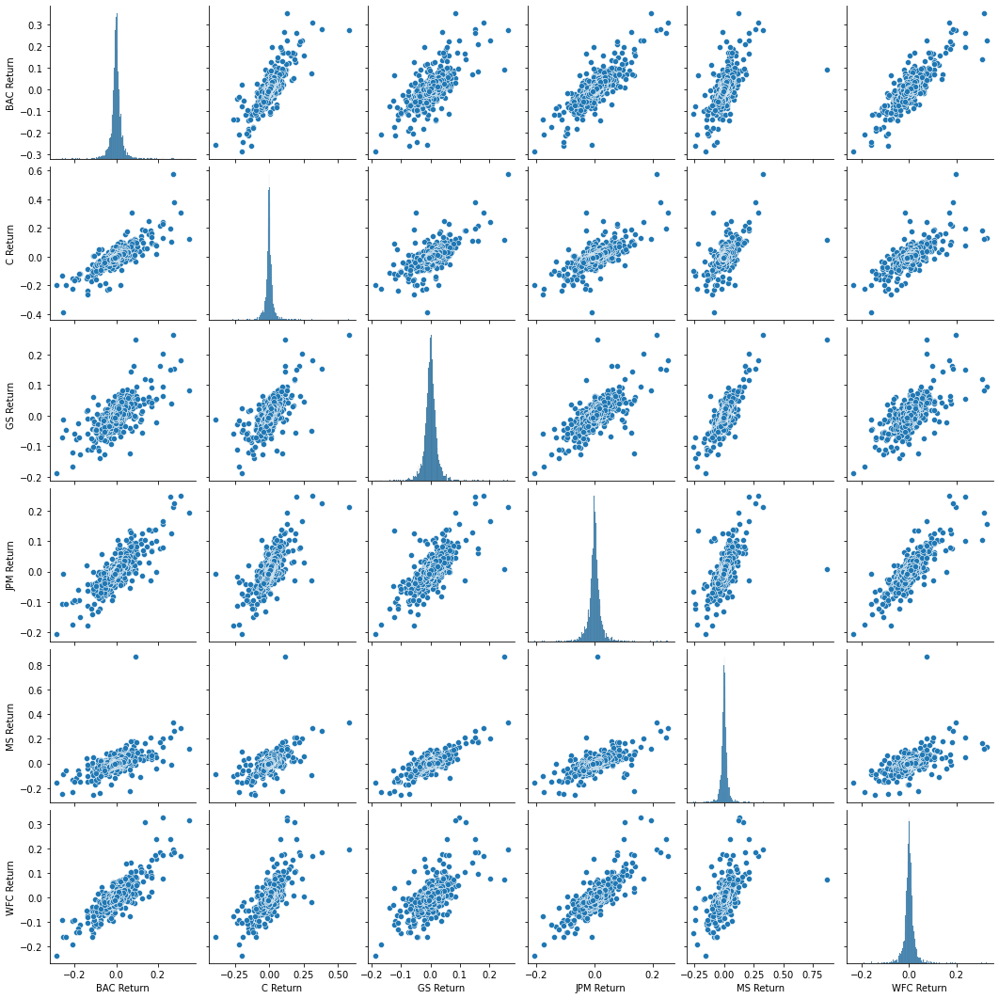

In [23]:
#returns a pair plot of our return dataframe at index 1
#May take a few minutes depending on size of data
sns.pairplot(returns[1:])

In [105]:
#shows lowest returns from start to end
returns.idxmin()

BAC Return   2009-01-20
C Return     2009-02-27
GS Return    2009-01-20
JPM Return   2009-01-20
MS Return    2008-10-09
WFC Return   2009-01-20
dtype: datetime64[ns]

In [39]:
#shows Highest returns from start to end
returns.idxmax()

BAC Return   2009-04-09
C Return     2008-11-24
GS Return    2008-11-24
JPM Return   2009-01-21
MS Return    2008-10-13
WFC Return   2008-07-16
dtype: datetime64[ns]

In [52]:
#Highest volatility of stocks
(returns.std().idxmax)

<bound method Series.idxmax of BAC Return    0.034148
C Return      0.035865
GS Return     0.023936
JPM Return    0.025821
MS Return     0.035130
WFC Return    0.028109
dtype: float64>

In [57]:
#returns volatility from certain time frame
returns.loc['2015-01-01':'2015-12-31'].std()

BAC Return    0.016148
C Return      0.015279
GS Return     0.014026
JPM Return    0.013964
MS Return     0.016008
WFC Return    0.012549
dtype: float64

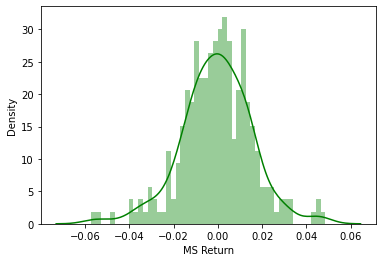

In [62]:
sns.distplot(returns.loc['2015-01-01':'2015-12-31']['MS Return'],color= 'green', bins=50)

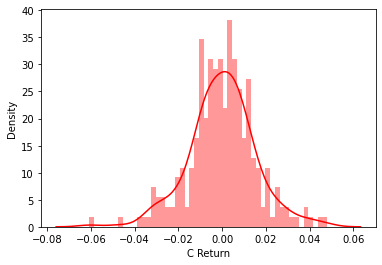

In [68]:
sns.distplot(returns.loc['2015-01-01':'2015-12-31']['C Return'], bins = 50, color = 'red', label='Returns of Citi')

In [106]:
#importing modules necessary for graphing
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
%matplotlib inline

# Optional Plotly Method Imports
import plotly
import cufflinks as cf
cf.go_offline()

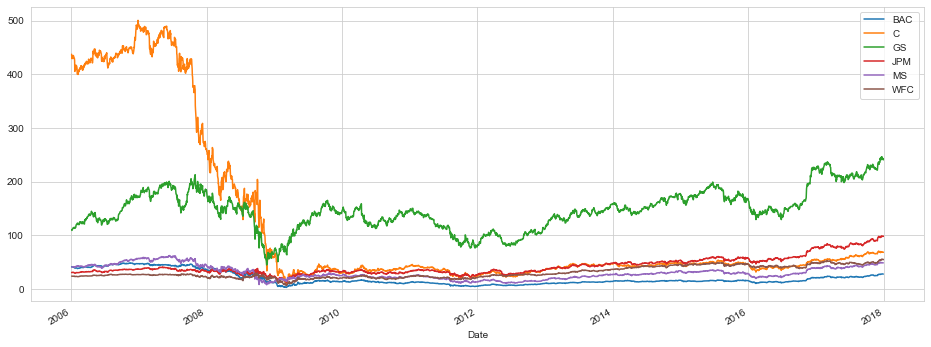

In [84]:
for tick in tickers:
    bank_stocks[tick]['Close'].plot(label=tick, figsize=(16,6))
plt.legend()

In [160]:
bank_stocks.xs(key='Close', axis=1, level='Stock Info').iplot()

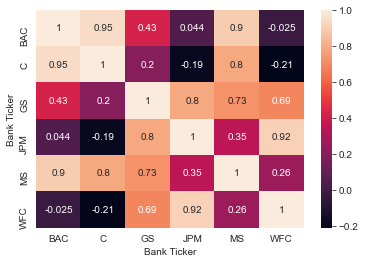

In [120]:
#Correlation heatmap of banks
sns.heatmap(bank_stocks.xs(key='Close', axis=1, level='Stock Info').corr(),annot=True)

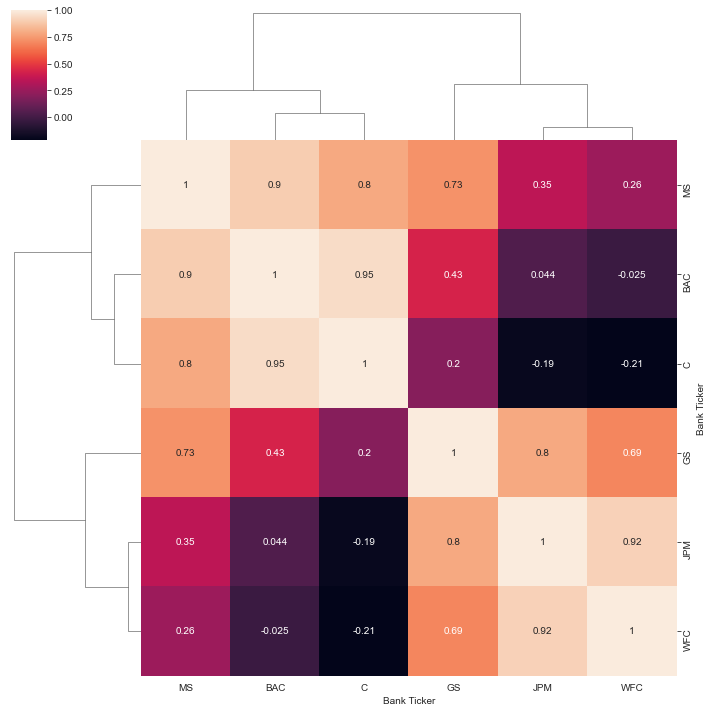

In [122]:
#cluster mapping the banks together
sns.clustermap(bank_stocks.xs(key='Close', axis=1, level='Stock Info').corr(),annot=True)

In [124]:
#interactive version of heatmap
close_corr = (bank_stocks.xs(key='Close', axis=1, level='Stock Info').corr())
close_corr.iplot(kind='heatmap', colorscale = 'rdylbu')

In [157]:
#shows candle stick representation of data
BAC_15 = BofA[['Open', 'High', 'Low', 'Close']].loc[BofA.index[2900:3020].sort_values(ascending=True)]
BAC_15.iplot(kind = 'candle')

In [170]:
#Simple Moving Average (SME) plot for closes fo 12, 21, and 55 days
MorganS['Close'].loc[MorganS.index[600:900].sort_values(ascending=True)].ta_plot(study='sma', periods = [12,21,55])

In [171]:
#displays SME but will bollinger bands
MorganS['Close'].loc[MorganS.index[600:900].sort_values(ascending=True)].ta_plot(study='boll')